In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="ticks", color_codes=True)

ds = pd.read_csv('AB_NYC_2019.csv')

In [3]:
ds

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


In [ ]:
ds.dtypes

In [ ]:
ds.isnull().sum()

In [4]:
'''Avem valori de NULL pt name, host_name, last review, reviews/month. Ca sa scapam de valori, gasim inlocuitori
ex: Putem in loc de NULL pt name si host_name sa avem valoarea 'No name'
Pentru last review putem spune 'Never Reviewed', iar pentru reviews/month putem pune valoarea 0'''
ds.fillna({'reviews_per_month':0}, inplace=True)
ds.fillna({'name':"No name"}, inplace=True)
ds.fillna({'host_name':"No name"}, inplace=True)
ds.fillna({'last_review':"No review"}, inplace=True)

In [ ]:
ds.isnull().sum()

In [ ]:
ds["price"].describe()

In [ ]:
histograma_pret=ds["price"].hist()

In [ ]:
'''majoritatea preturilor sunt sub 1000, un procent nesemnificativ il gasim intre 1000 si 2000, deci, pentru a avea o histograma
mai clara, vom folosi valorile de sub 1000'''
hist_price1=ds["price"][ds["price"]<1000].hist()

In [ ]:
ds[ds["price"]>1000]

In [ ]:
#239 de valori dintr-un total de 48895 => am putea scapa de ele. Sunt valori de peste 2000 -> preturi exagerate, posibile erori?
ds=ds[ds["price"]<1000]

In [ ]:
histograma_pret2=ds["price"][ds["price"]<500].hist()

In [ ]:
histograma_pret2=ds["price"][ds["price"]<250].hist()

In [ ]:
#histograma pentru preturile sub 250 pare sa aiba o distributie mai normala (Gaussiana)
#am putea folosi valoarea pretului de 250 din dataset-ul nostru ca threshold
ds[ds["price"]<250]

In [5]:
#Ramanem cu 42669 de valori din cele 48895 initiale. Good enough
ds=ds[ds["price"]<250]

In [ ]:
ds["price"].describe()

In [ ]:
'''se poate observa ca, fata de inceput, cand media era 152 si maximul 10000.000000
am reusit sa aducem dataset-ul la o valoare medie de 107, cu un maxim de 249, deci o distributie relativ normala'''

In [ ]:
ds["neighbourhood"].value_counts()

In [ ]:
ds["neighbourhood_group"].value_counts()

In [ ]:
counter=ds.groupby("neighbourhood").filter(lambda x: x["neighbourhood"].count()==1)
len(counter["neighbourhood"])

In [ ]:
#avem 5 valori din neighbourhood care apar o singura data => cu siguranta pot fi eliminate
#putem incerca sa mai curatam din dataset, cautam o valoare de threshold si pentru neighbourhood 
#ex: Pastram doar valorile de peste 100-200
counter=ds.groupby("neighbourhood").filter(lambda x: x["neighbourhood"].count()>150)
len(counter["neighbourhood"])

In [ ]:
'''neighbourhood group are doar 5 valori, dintre care Brooklyn si Manhattan sunt majoritare => am putea crea o valoare
medie a pretului in functie de neighbourhood group'''
pret_ng=ds.groupby("neighbourhood_group")["price"].mean()
pret_ng

In [ ]:
#Se poate observa ca Manhattan este cel mai scump cartier din NYC
ds["room_type"].value_counts()

In [ ]:
#Putem folosi plotting pentru a analiza distributia pretului in functie de fiecare cartier si tipul de camera
catplot=sns.catplot(x="neighbourhood_group",y="price",hue="room_type",data=ds,kind='strip')

In [ ]:
'''Dupa cum era de asteptat, cel mai scump tip de camera este entire home, dupa care urmeaza private room, iar apoi shared.
De asemenea, putem observa ca in Manhattan si in Brooklyn intalnim cele mai multe camere al caror pret depaseste valoarea de 150
So, clearly, Manhattan si Brooklyn sunt cele mai busy, cum era si de asteptat, fiind cele mai importante cartiere din NYC'''

In [ ]:
'''Verific host_id, semnificatie, numar de aparitii, daca sunt valori care se repeta, maybe cleaning'''
h_id=ds.groupby(["host_id"])
max(h_id.size())

In [ ]:
h_id.size().value_counts().head()

In [ ]:
h_id.size().value_counts().tail()

In [ ]:
#deci, avem unele host_id care se repeta pana si de 238 de ori
h_id_counter=ds["host_id"].value_counts()
max_h_id=h_id_counter.idxmax()
max_h_id

In [ ]:
ds[ds["host_id"]==max_h_id]

In [ ]:
'''Am gasit, deci, host-ul cu cele mai multe listari si anume Sonder (NYC)'''
ds[ds["host_id"]==max_h_id]['availability_365'].describe()

In [ ]:
'''Intrucat noi vrem sa realizam o predictie a pretului, coloane precum id si host_name nu ne sunt de folos
Intrucat host_id e integer, e mai convenabil sa lucram cu host_id, decat cu host_name. So, we can drop them'''
ds=ds.drop(columns=["id","host_name"])

In [6]:
'''Next, studiem coloana de name. Ce date ne ofera, care e diferenta de lungime, de ce unele au nume ft lung, altele ft scurt'''
ds["name_len"]=ds["name"].str.split().apply(len)

In [ ]:
print(ds["name_len"].max())
print(ds["name_len"].min())
print(ds["name_len"].idxmax())
print(ds["name_len"].idxmin())
max_name=ds["name_len"].idxmax()
min_name=ds["name_len"].idxmin()

In [ ]:
ds.at[max_name,"name"]

In [ ]:
ds.at[min_name,"name"]

In [ ]:
'''Deci, avem si hosts al caror nume nu este dat/specificat. Dar, avem si hosts care includ detalii despre locatie in numele lor
Foarte posibil ca un host al carui nume nu e dat deloc sa nu fie bagat in seama => putine reviews, maybe none at all
=> Exista o corelatie? Let's find out '''
ds.name_len.hist()

In [ ]:
#Putem folosi valorile sub 50 pt plotting
ds["name_len"].corr(ds["number_of_reviews"])

In [ ]:
ds.plot.scatter(x="name_len",y="number_of_reviews")

In [ ]:
ds1=ds.sample(1000)
ds1.plot.scatter(x="name_len",y="number_of_reviews")

In [ ]:
'''Welp... not really
Incercam intre price si name'''
ds.plot.scatter(x="price",y="name_len")
ds["name_len"].corr(ds["price"])

In [ ]:
ds1.plot.scatter(x="price",y="name_len")

In [ ]:
'''Just to be sure, vom face un mean value pe room type
Expectations: entire room - most expensive, then private room, and finally, shared room- cheapest'''
ds["room_type"].value_counts()

In [ ]:
rt_mean=ds.groupby("room_type")["price"].mean()
rt_mean

In [ ]:
'''Just as we expected'''

In [ ]:
'''Next thing: minimum nights - semnificatie, valori, cleaning?'''
ds["minimum_nights"].describe()

In [ ]:
#Again, range e intre 1 noapte si 1250 de nopti, dar media e de 6.85... 
#O sa lucrez cu o histograma pana cand observ valori normale
ds["minimum_nights"].hist()

In [ ]:
hist_mn1=ds["minimum_nights"][ds["minimum_nights"]<10].hist()

In [ ]:
hist_mn2=ds["minimum_nights"][ds["minimum_nights"]>30].hist()
ds["minimum_nights"][ds["minimum_nights"]>30].describe()

In [ ]:
'''Intrucat oricum majoritatea datelor sunt sub 30 de nopti, ca sa nu renunt de tot la date, voi inlocui valorile de peste 30
cu valoarea 30'''
ds.loc[(ds.minimum_nights>30),"minimum_nights"]=30

In [ ]:
hist_mn3=ds["minimum_nights"][ds["minimum_nights"]<30].hist()
hist_mn3

In [ ]:
'''Posibil sa gasim din nou o corelatie cu pretul? Maybe in functie de pret exista o relatie cu numarul minim de nopti'''
ds.plot.scatter(x="minimum_nights",y="price")
ds["minimum_nights"].corr(ds["price"])

In [ ]:
ds1.plot.scatter(x="minimum_nights",y="price")

In [ ]:
'''One more thing, availability_365? Probabil se refera la disponibilitatea pe tot anul, dar mai bine sa analizam'''
ds["availability_365"].describe()

In [ ]:
ds["availability_365"].hist()

In [ ]:
#Valoarea medie pare sa fie una ok, nu sunt exagerari si dupa valori, cel mai probabil we guessed right its meaning


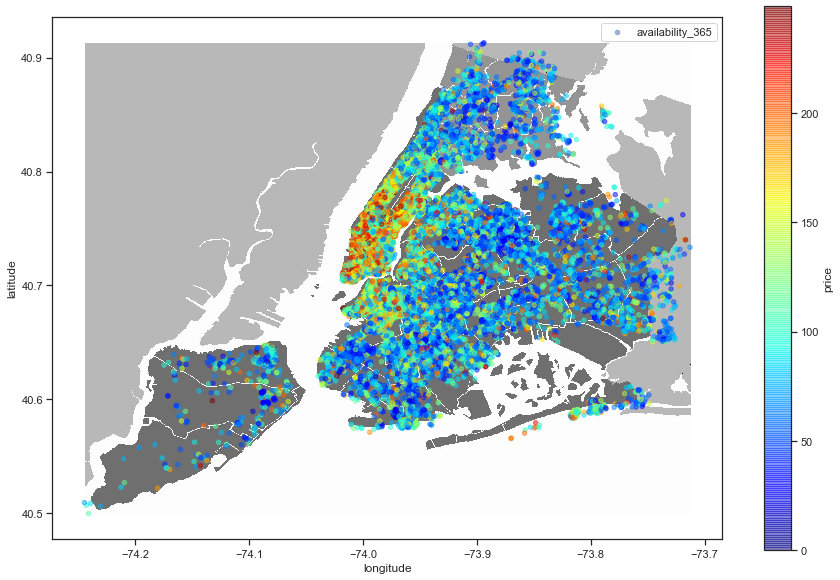

In [8]:
from PIL import Image 
import matplotlib.pyplot as plt
img=Image.open('New_York_City_.png')
plt.figure(figsize=(15,10))
xmax=ds["longitude"].max()
xmin=ds["longitude"].min()
ymax=ds["latitude"].max()
ymin=ds["latitude"].min()
plt.imshow(img,zorder=0,extent=[xmin,xmax,ymin,ymax])
ax=plt.gca()
ds.plot(kind='scatter',x='longitude',y='latitude',label='availability_365',c='price',ax=ax, 
           cmap=plt.get_cmap('jet'),colorbar=True,alpha=0.5,zorder=1)
plt.legend()
plt.show()

In [ ]:
#Heatmap facut pentru a vizualiza pe harta NYC cum arata host-urile in functie de pret si availability
#=> Se pot vedea zonele de interes, unde se calatoreste mai mult, dar si unde e mai scumpa cazarea

In [9]:
    import folium
    from folium import plugins
    from folium.plugins import HeatMap
    #m=folium.Map(location=[40.730610, -73.935242],zoom_start=11)
    #heat_data=[[row['latitude'],row['longitude']] for index, row in ds[['latitude','longitude']].iterrows()]
    #hh=HeatMap(heat_data).add_to(m)
    #m
    m=folium.Map(location=[40.730610, -73.935242],zoom_start=11)
    HeatMap(ds[['latitude','longitude']].dropna(),radius=10,gradient={0.2:'blue',0.4:'green',0.6:'orange',1.0:'red'}).add_to(m)
    display(m)

Now, time to get rid of what isn't that useful -> name, last_review (pastram doar nr of reviews), latitudine si longitudine
(nu ne ajuta cu absolut nimic pt predictie) si host_id

In [ ]:
ds.drop(["name","last_review","latitude","longitude","host_id"],axis=1,inplace=True)

In [ ]:
ds

In [ ]:
ds.dtypes

In [ ]:
#Matricea de corelatie
correlation=ds.corr(method='pearson')
plt.figure(figsize=(15,10))
sns.heatmap(correlation,annot=True)
ds.columns